In [1]:
import os


if "original_dir" in globals():
    # current_dir = os.path.dirname(original_dir)
    current_dir = original_dir
    os.chdir(current_dir)
    print(f"Current directory: {current_dir}")
else:
    original_dir = os.getcwd()
    print(f"Current directory: {original_dir}")

os.chdir("../../")
print(f"Changed directory: {os.getcwd()}")

Current directory: d:\northeastern\neu_dev\neumove_org\myoassist\docs\tutorial
Changed directory: d:\northeastern\neu_dev\neumove_org\myoassist


In [2]:
import numpy as np
from rl_train.utils.data_types import DictionableDataclass
from rl_train.utils.environment_handler import EnvironmentHandler
from rl_train.envs import myoassist_leg_imitation_exo
from rl_train.utils.data_types import DictionableDataclass

MyoSuite:> Registering Myo Envs


# Load pretrained model and evaluate

In [3]:
import os
from rl_train.utils.train_log_handler import TrainLogHandler
from rl_train.utils.train_checkpoint_data_imitation import ImitationTrainCheckpointData

# log_dir = "docs/assets/tutorial_rl_models/train_session_20250728-161129_tutorial_partial_obs" # partial obs
log_dir = "docs/assets/tutorial_rl_models/train_session_20250729-005528_tutorial_full_obs" # Full obs
analyze_result_dir = os.path.join(log_dir,"analyze_results")
if not os.path.exists(analyze_result_dir):
    os.makedirs(analyze_result_dir)

log_handler = TrainLogHandler(log_dir)
log_handler.load_log_data(ImitationTrainCheckpointData)

In [4]:
from rl_train.utils.data_types import DictionableDataclass
DictionableDataclass.to_dict(log_handler.log_datas[-1])

{'approx_kl': 0.011483825743198395,
 'clip_fraction': 0.13798624674479168,
 'clip_range': 0.2,
 'clip_range_vf': 100.0,
 'entropy_loss': 9.211852280298869,
 'explained_variance': 0.04044783115386963,
 'learning_rate': 0.0001,
 'loss': 27.13361930847168,
 'n_updates': 36172,
 'policy_gradient_loss': -0.015796960345081365,
 'std': 0.21472030878067017,
 'value_loss': 54.503913497924806,
 'num_timesteps': 19939328,
 'average_num_timestep': 73.74620999438518,
 'average_reward_per_episode': 39.46581055402342,
 'average_reward_dict_per_episode': {'forward_reward': 56.443518429661,
  'muscle_activation_penalty': -38.1451287131066,
  'muscle_activation_diff_penalty': 60.64997507578231,
  'foot_force_penalty': 34.23430685417124,
  'joint_constraint_force_penalty': -2.9096208775505596,
  'muscle_activation_penalty_per_step': -174.0469864643148,
  'average_velocity_per_step': -2.134255111065089,
  'footstep_delta_time': 19.01942292095559,
  'qpos_imitation_rewards': 260.1350674578694,
  'qvel_imit

## Plot Learning Curve

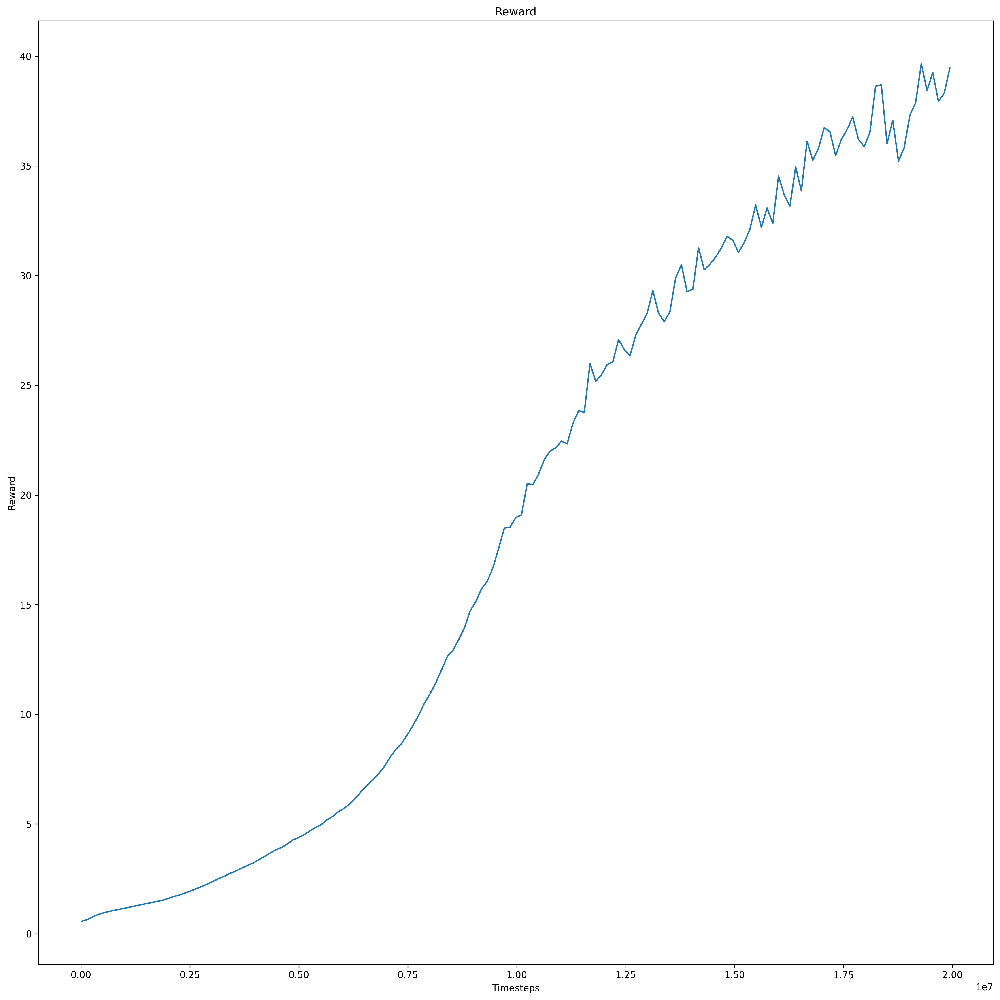

In [5]:
import sys
sys.modules.pop('package.train_log_analyzer', None)
from rl_train.analyzer.train_log_analyzer import TrainLogAnalyzer
train_log_analyzer = TrainLogAnalyzer(log_handler)
train_log_analyzer.plot_reward(result_dir=analyze_result_dir, show_plot=True)


## Load Session Config

In [6]:
import json
from rl_train.train.train_configs.config_imitation import ImitationTrainSessionConfig
from rl_train.utils.data_types import DictionableDataclass
with open(os.path.join(log_dir, "session_config.json"), 'r') as f:
    config_dict = json.load(f)
config = DictionableDataclass.create(ImitationTrainSessionConfig, config_dict)


In [7]:
from rl_train.envs.myoassist_leg_base import MyoAssistLegBase
gait_data_name = f"gait_evaluated_data.json"
if os.path.exists(os.path.join(analyze_result_dir, gait_data_name)):
    user_input = input(f"Regenerate evaluate data? ({gait_data_name}) (y/n(anything))")
else:
    user_input = "y"
is_regen_evaluating_data = True if user_input == "y" else False

from rl_train.analyzer.gait_evaluate import ImitationGaitEvaluator
gait_evaluator = ImitationGaitEvaluator(log_handler, config)
gait_evaluator.load_reference_data()
gait_evaluator.initialize_env()
if is_regen_evaluating_data:
    gait_data_path = gait_evaluator.evaluate(result_dir=analyze_result_dir,
                                            file_name=gait_data_name,
                                            velocity_mode=MyoAssistLegBase.VelocityMode.UNIFORM,
                                            target_velocity_period=3,
                                            )
else:
    gait_data_path = os.path.join(analyze_result_dir, gait_data_name)
    

===============REFERENCE DATA LOADING================
===============REFERENCE DATA LOADING DONE================
Loading reference data from myoassist_rl/reference_data/short_reference_gait.npz
config.env_params.env_id='myoAssistLegImitationExo-v0'
=================environment seed: 1234=====================
=================environment model_path: models/22muscle_2D/myoLeg22_2D_TUTORIAL.xml=====================
    NeuMove MyoLegBase
    
===============================PARAMETERS=============================
self._reward_keys_and_weights=ImitationTrainSessionConfig.EnvParams.RewardWeights(forward_reward=1.0, muscle_activation_penalty=0.1, muscle_activation_diff_penalty=0.1, footstep_delta_time=0.0, average_velocity_per_step=0.0, muscle_activation_penalty_per_step=0.0, joint_constraint_force_penalty=1.0, foot_force_penalty=0.5, qpos_imitation_rewards={'pelvis_ty': 0.1, 'pelvis_tilt': 1.0, 'hip_flexion_l': 0.2, 'hip_flexion_r': 0.2, 'knee_angle_l': 1.0, 'knee_angle_r': 1.0, 'ankle_angle

In [8]:
import sys
sys.modules.pop('package.gait_analyze', None)
sys.modules.pop('package.gait_evaluate', None)
from rl_train.analyzer.gait_analyze import GaitAnalyzer
from rl_train.analyzer.gait_evaluate import GaitData


gait_data = GaitData()
gait_data.read_json_data(gait_data_path)
segmented_ref_data = np.load("rl_train/reference_data/segmented.npz", allow_pickle=True)
segmented_ref_data = {key: segmented_ref_data[key] for key in segmented_ref_data.files}
gait_analyzer = GaitAnalyzer(gait_data, segmented_ref_data, True)

self.gait_data.series_data.keys()=dict_keys(['joint_data', 'actuator_data', 'sensor_data', 'physics_data', 'target_data'])


d:\northeastern\neu_dev\neumove_org\myoassist\myoassist_rl\rl_train\analyzer\gait_analyze.py:147: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[4][1].legend()


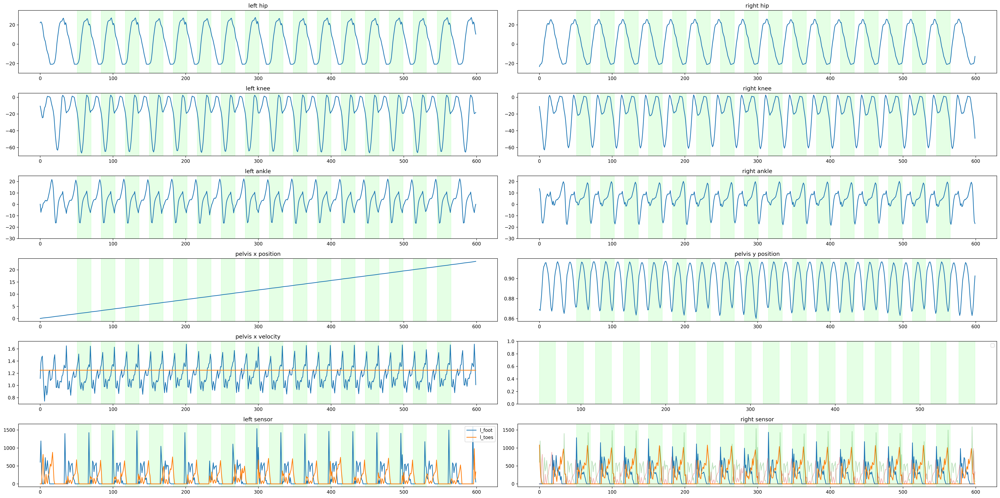

In [9]:
gait_analyzer.plot_entire_result(result_dir=analyze_result_dir,is_right_foot_based=True)


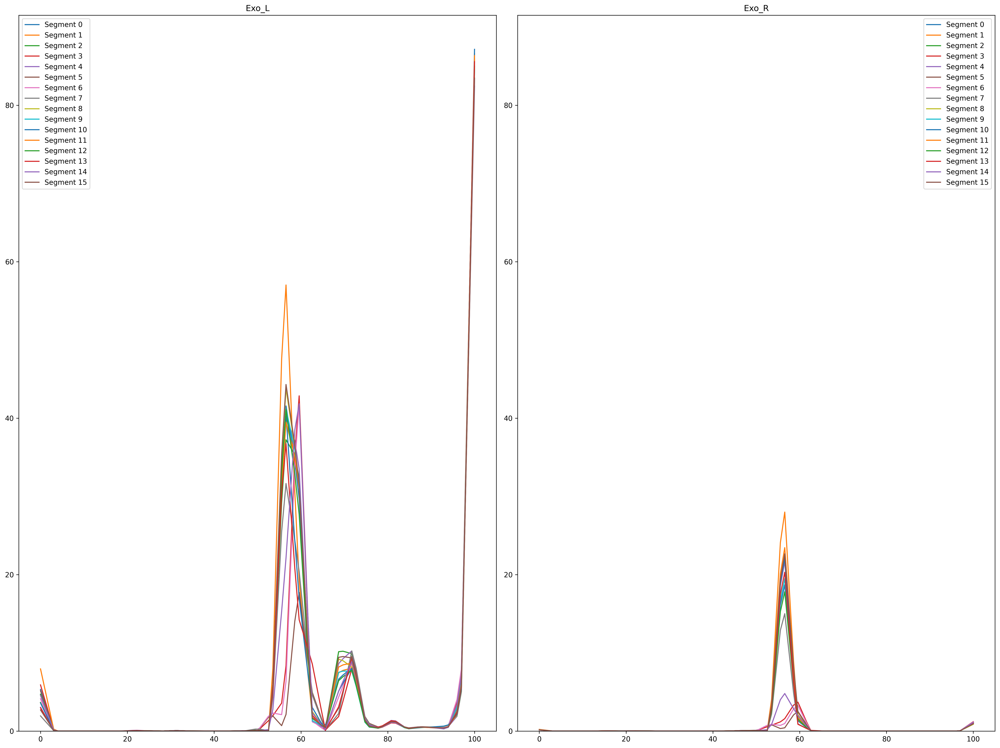

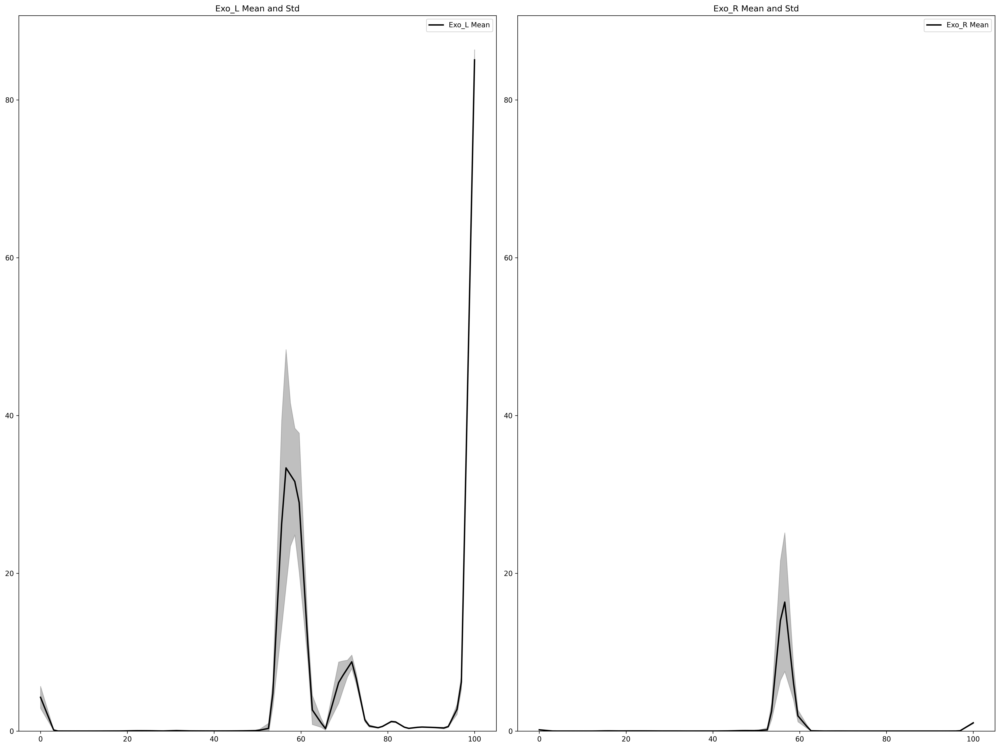

In [10]:
gait_analyzer.plot_exo_segmented_data(result_dir=analyze_result_dir)

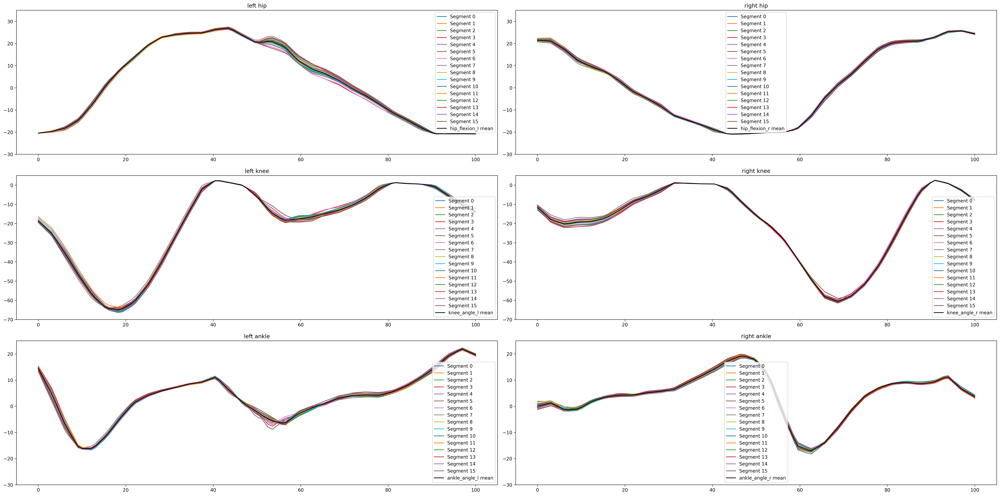

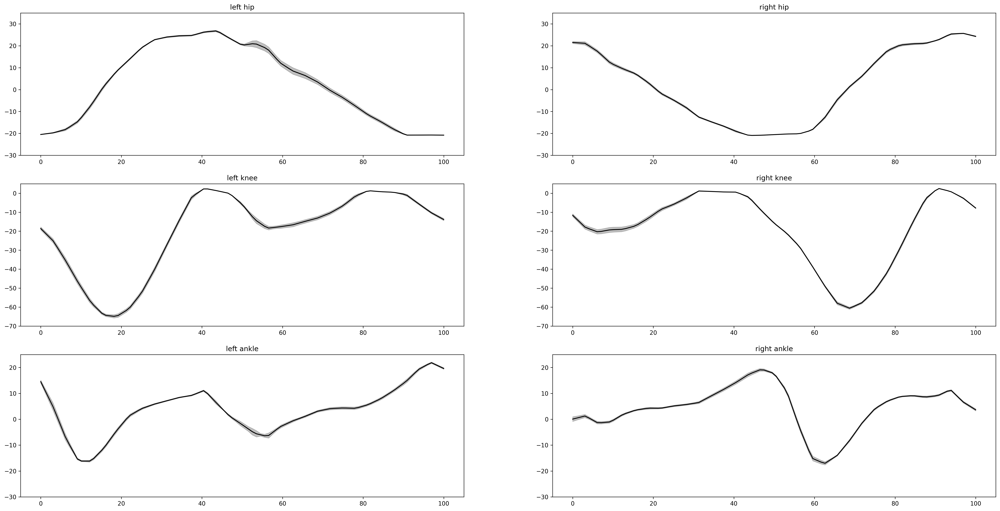

In [11]:
gait_analyzer.plot_segmented_kinematics_result(result_dir=analyze_result_dir)

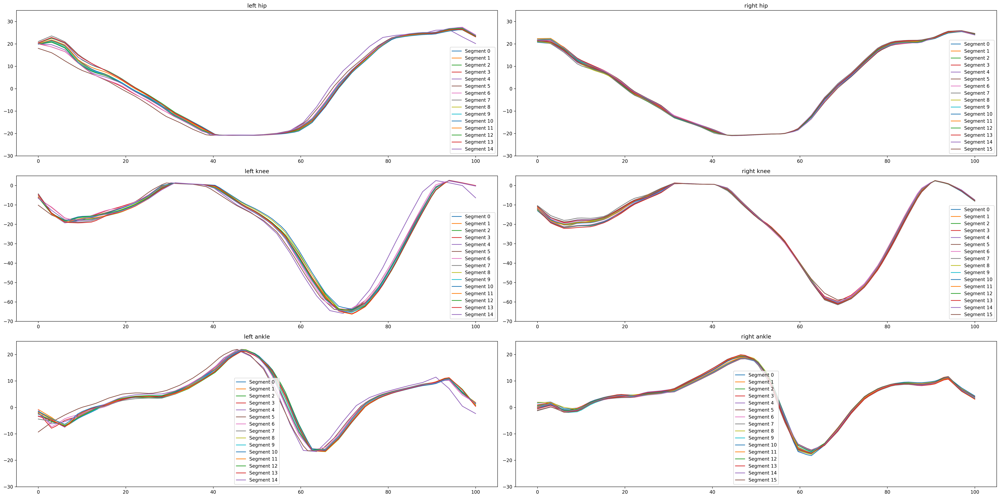

DEBUG:: joint='hip_flexion_l', data.shape=(15, 100)
DEBUG:: joint='hip_flexion_r', data.shape=(16, 100)
DEBUG:: joint='knee_angle_l', data.shape=(15, 100)
DEBUG:: joint='knee_angle_r', data.shape=(16, 100)
DEBUG:: joint='ankle_angle_l', data.shape=(15, 100)
DEBUG:: joint='ankle_angle_r', data.shape=(16, 100)


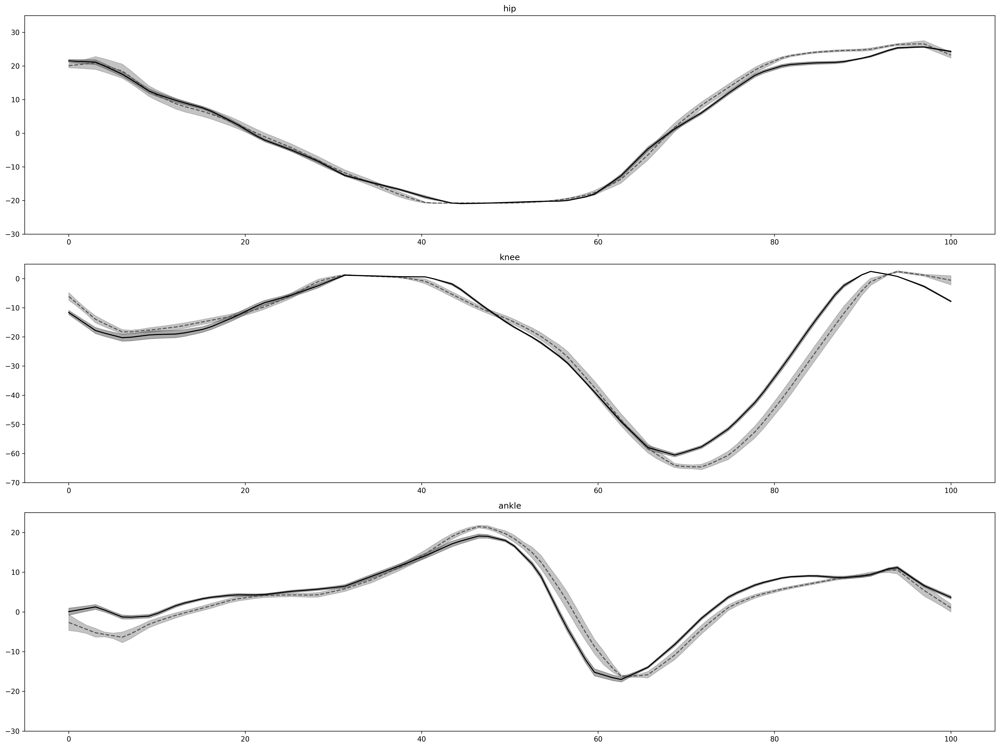

In [12]:
gait_analyzer.plot_left_right_comparison(result_dir=analyze_result_dir)

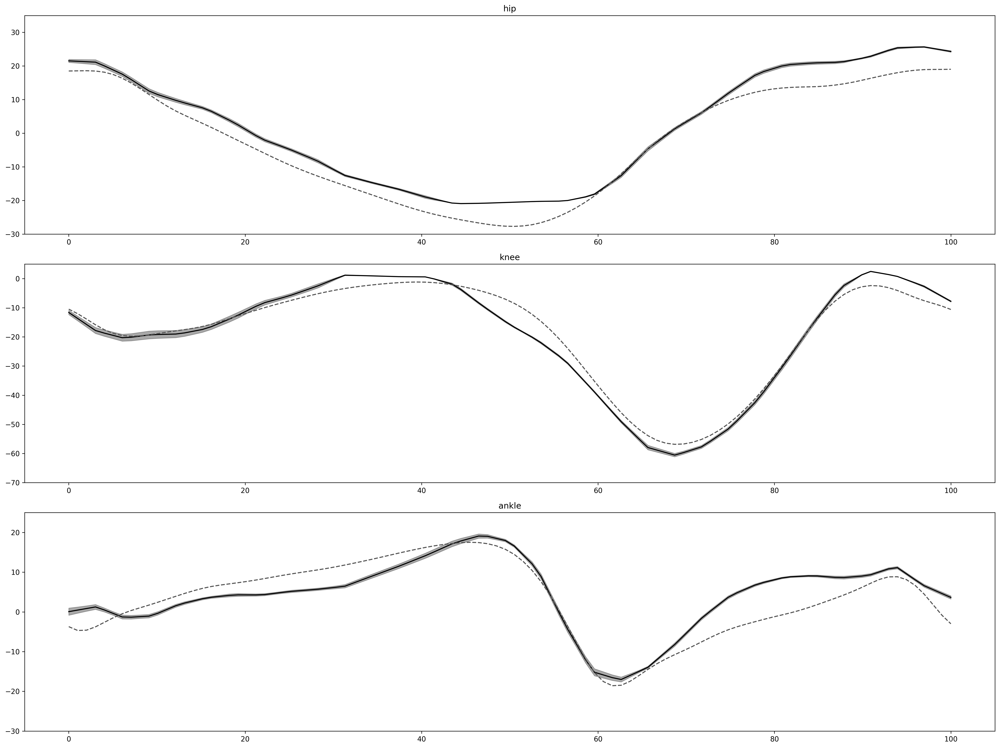

In [ ]:
gait_analyzer.plot_right_ref_comparison(result_dir=analyze_result_dir)

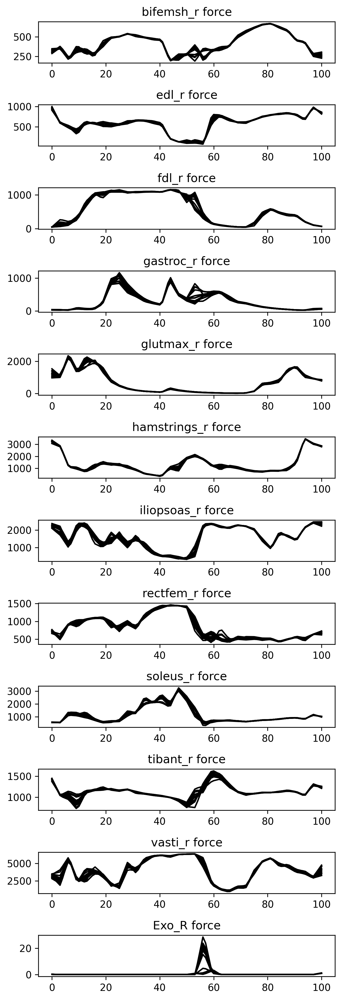

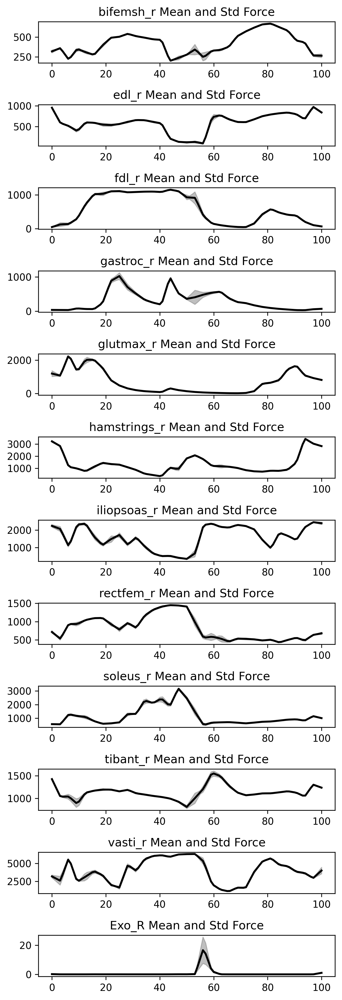

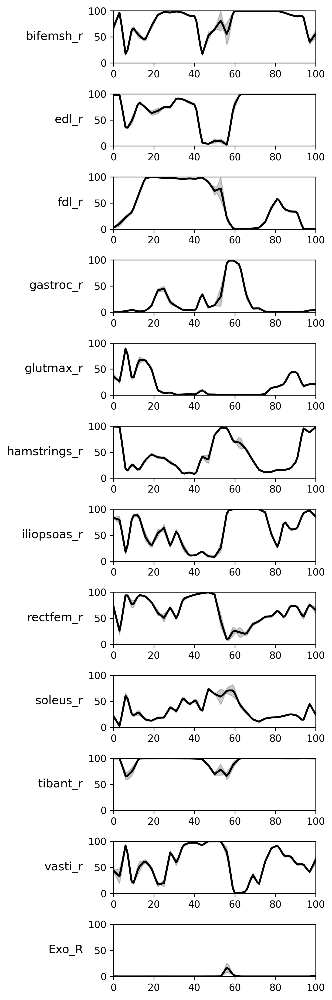

In [14]:
gait_analyzer.plot_segmented_muscle_data(result_dir=analyze_result_dir, is_plot_right=True)

In [15]:
gait_evaluator.replay(gait_data_path, os.path.join(analyze_result_dir, "replay.mp4"))

[array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[201, 154, 152],
         [201, 154, 152],
         [201, 154, 152],
         ...,
         [201, 154, 152],
         [201, 154, 152],
         [201, 154, 152]],
 
        [[201, 154, 152],
         [201, 154, 152],
         [201, 154, 152],
         ...,
         [201, 154, 152],
         [201, 154, 152],
         [201, 154, 152]],
 
        [[201, 154, 152],
         [201, 154, 152],
         [201, 154, 152],
         ...,
         [201, 154, 152],
  